# Базовые алгоритмы обучения без учителя и работа с текстовыми данными

### 1. Понижение размерности и визуализация данных

In [211]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [212]:
df = pd.read_csv('pulsar_stars.csv')
df = df.dropna()
df['Type'] = pd.Categorical(df['Type'])

In [213]:
num_df = df.select_dtypes(include='float64').copy()
num_df['y'] = df['Type'].cat.codes

In [214]:
for column in num_df.columns:
    scale = StandardScaler().fit(num_df[[column]])
    num_df[[column]] = scale.transform(num_df[[column]])

## PCA

In [215]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(num_df.values)
num_df['pca1'] = pca_result[:,0]
num_df['pca2'] = pca_result[:,1] 
num_df['pca3'] = pca_result[:,2]

<AxesSubplot:xlabel='pca1', ylabel='pca2'>

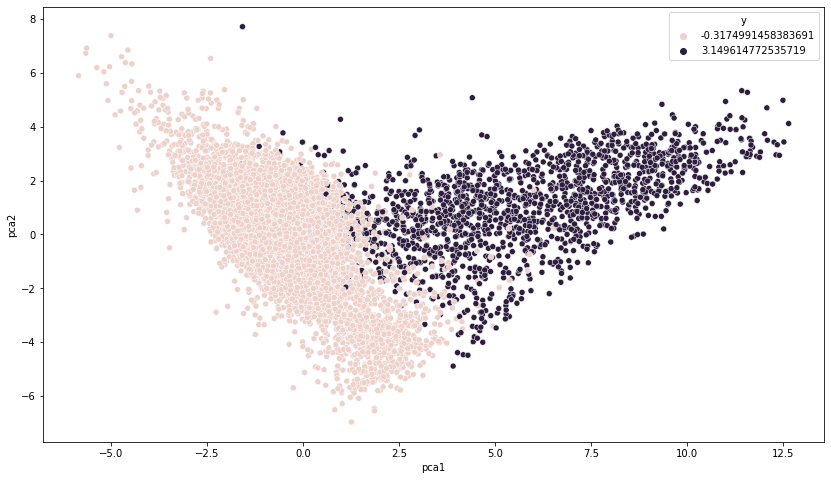

In [216]:
plt.figure(figsize=(14,8))
sns.scatterplot(
    x="pca1", y="pca2",
    hue="y",
    data=num_df,
    legend="full")

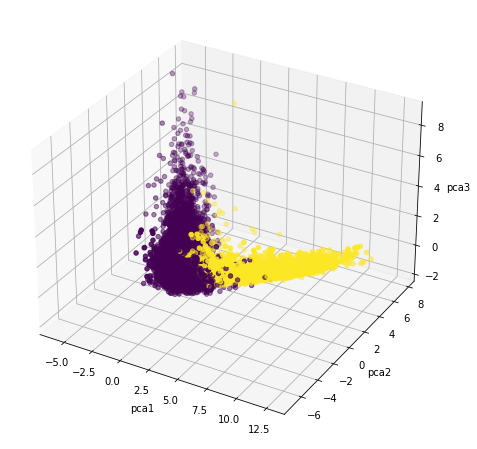

In [217]:
ax = plt.figure(figsize=(14,8)).gca(projection='3d')
ax.scatter(
    xs=num_df["pca1"], 
    ys=num_df["pca2"], 
    zs=num_df["pca3"], 
    c=num_df["y"]
)
ax.set_xlabel('pca1')
ax.set_ylabel('pca2')
ax.set_zlabel('pca3')
plt.show()

## TSNE

In [218]:
tsne = TSNE(n_components=2, perplexity=40, n_iter=500)
tsne_results = tsne.fit_transform(num_df)

<AxesSubplot:xlabel='tsne1', ylabel='tsne2'>

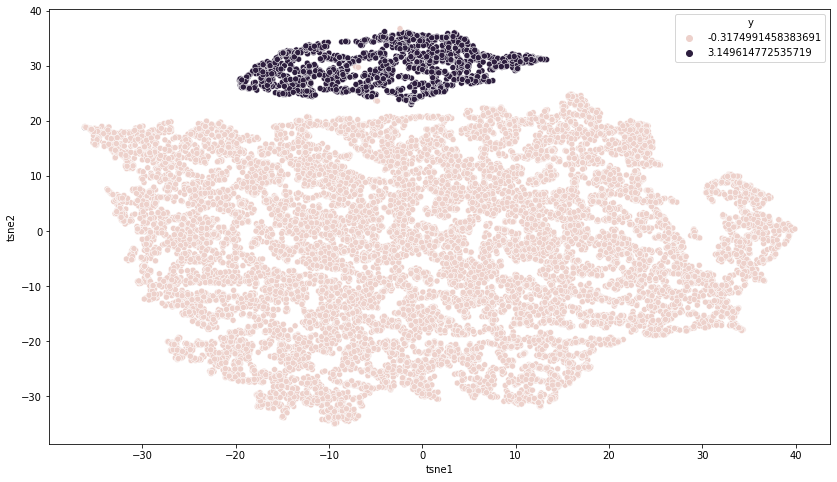

In [219]:
num_df['tsne1'] = tsne_results[:,0]
num_df['tsne2'] = tsne_results[:,1]
plt.figure(figsize=(14,8))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="y",
    data=num_df,
    legend="full",
)

# 2. Кластерный анализ

## 1) Квантование изображения (KMeans)

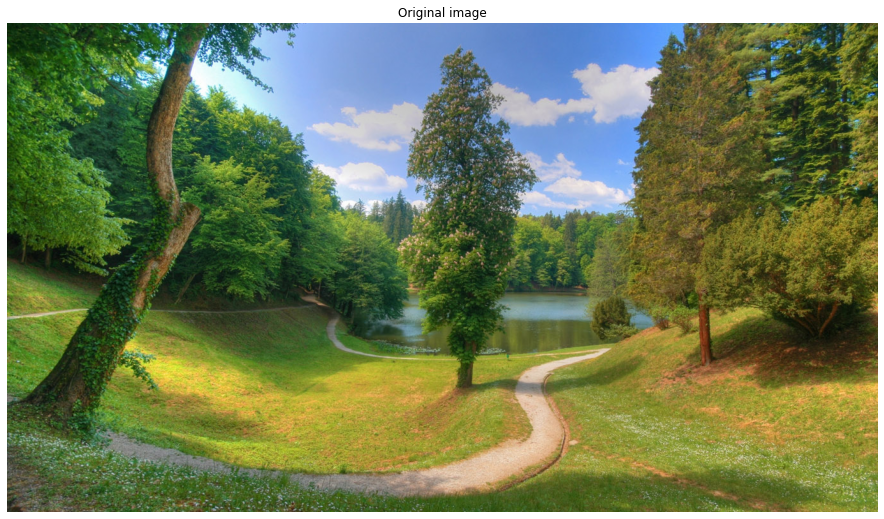

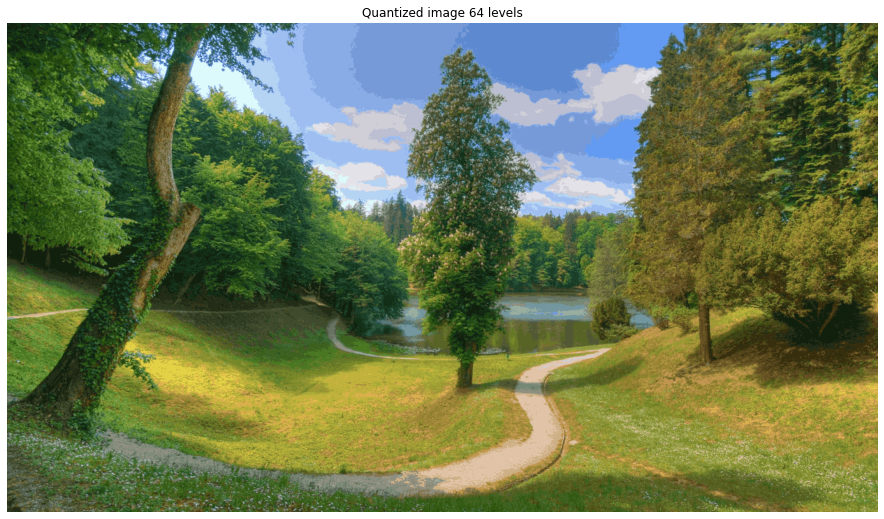

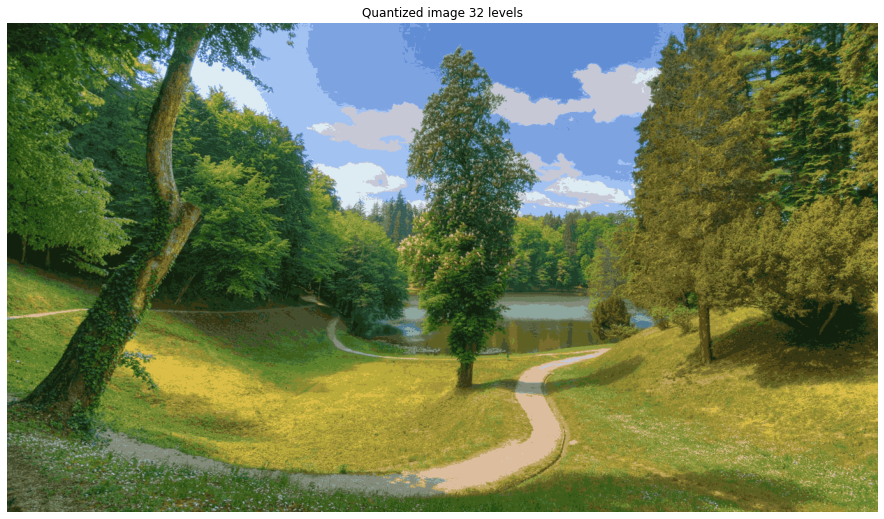

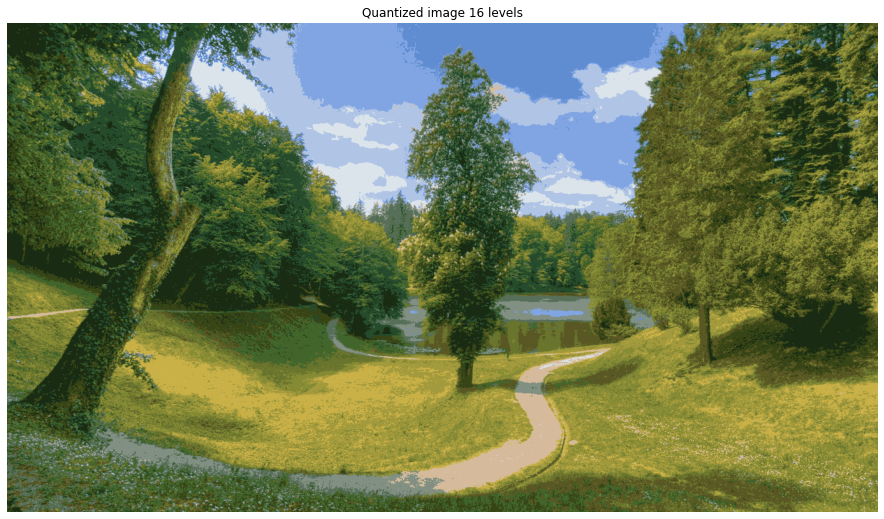

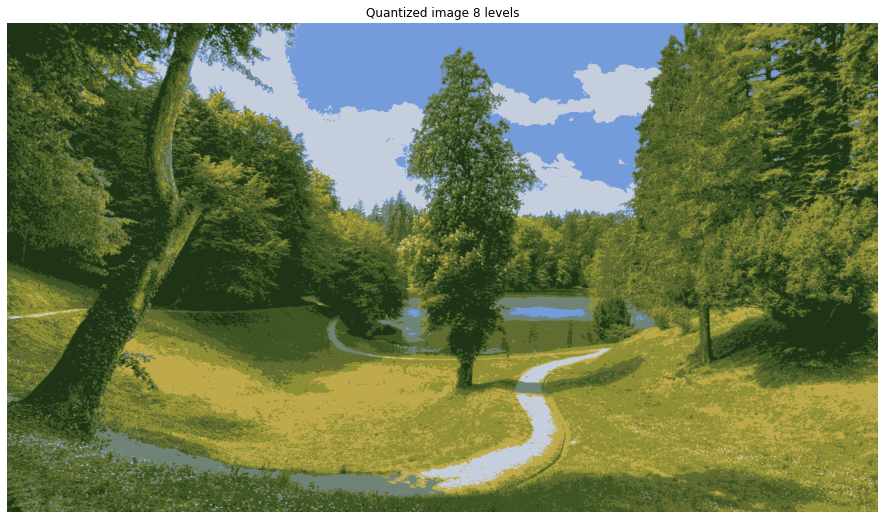

In [220]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.cluster import KMeans


def recreate_image(codebook, labels, w, h):
    d = codebook.shape[1]
    image = np.zeros((w, h, d))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image


N_COLORS = [64, 32, 16, 8]
SUBSAMPLE_SIZE = 0.01

image = Image.open('nature.jpg')
image = np.array(image, dtype=np.float64) / 255

w, h, d = tuple(image.shape)
image_array = np.reshape(image, (w * h, d))
img_subsample = image_array[np.random.choice(w * h, int(w * h * SUBSAMPLE_SIZE)), :]

models = []
for colors in N_COLORS:
    kmeans = KMeans(n_clusters=colors).fit(img_subsample)
    models.append(kmeans)
    
plt.figure(figsize=(16,9))
plt.axis('off')
plt.title('Original image')
plt.imshow(image) 

for model in models:
    labels = model.predict(image_array)
    plt.figure(figsize=(16,9))
    plt.clf()
    plt.axis('off')
    plt.title(f'Quantized image {model.get_params().get("n_clusters")} levels')
    plt.imshow(recreate_image(model.cluster_centers_, labels, w, h))

## 2) Силуэтные графики для KMeans

For n_clusters = 4 The average silhouette_score is : 0.5830422035169395
For n_clusters = 5 The average silhouette_score is : 0.5740089825824137
For n_clusters = 6 The average silhouette_score is : 0.5206045531413668


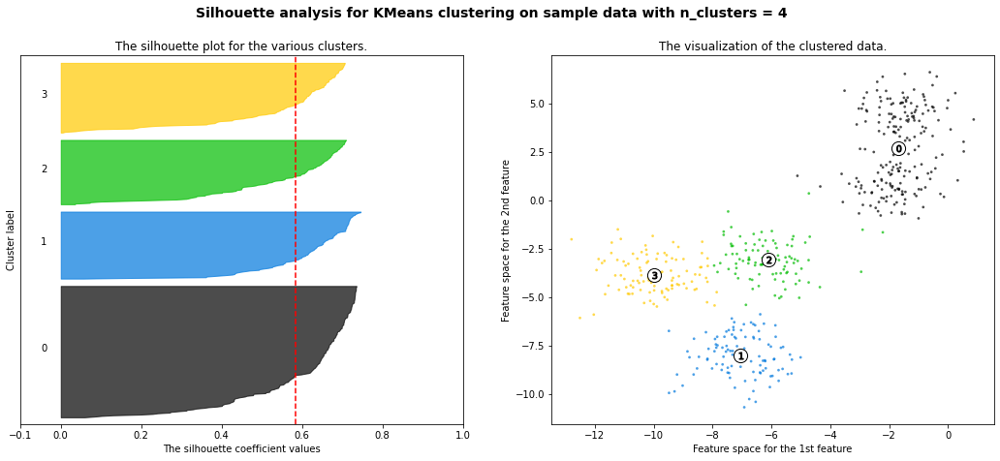

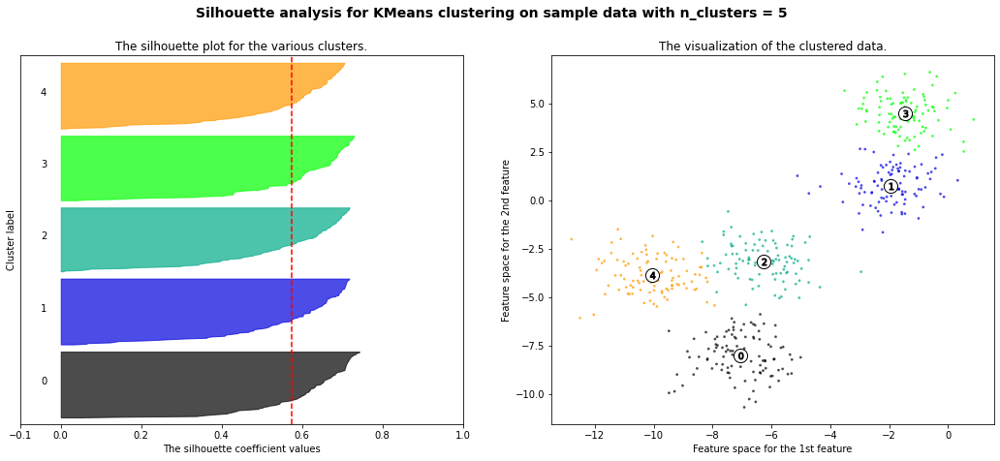

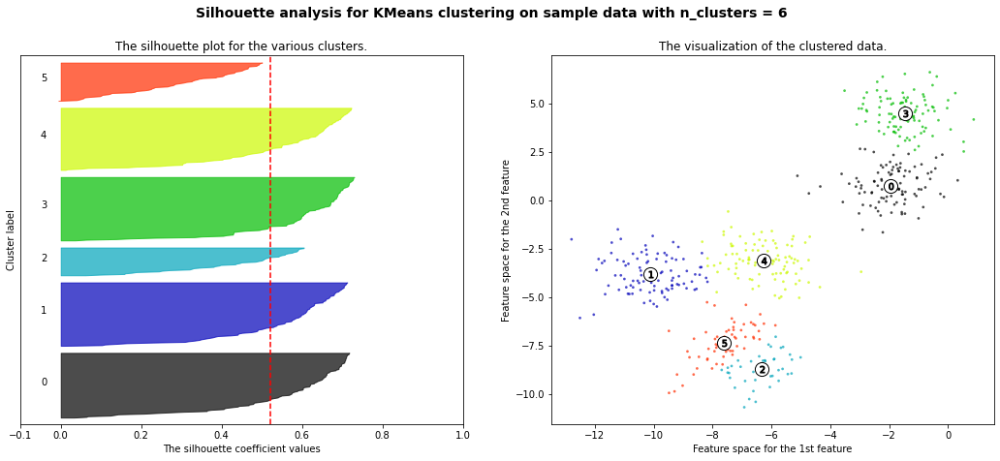

In [221]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=5,
                  shuffle=True,
                  random_state=1)

range_n_clusters = [4, 5, 6]

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#### silhouette coefficient варианта с 6 кластерами, а также его размер слишком отличается от других. Это может показывать что это ошибочная информация и кластеров не 6. Варианты с 4 и 5 кластерами хоть и имееют схожие silhouette coefficient, однако в 5 - они также имеют одинаковый размер.

## 3) EM 

In [222]:
from sklearn.mixture import GaussianMixture
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [223]:
mean1 = [0, 0]
cov1 = [[1, 0],
        [0, 1]]

mean2 = [5, 5]
cov2 = [[3, 0],
        [0, 3]]

x1 = np.random.default_rng().multivariate_normal(mean1, cov1, 1000)
x2 = np.random.default_rng().multivariate_normal(mean2, cov2, 1000)
df = np.vstack([x1,x2])

In [224]:
gm = GaussianMixture(n_components=2, covariance_type='diag')
labels = gm.fit_predict(df)
print('means\n',gm.means_)
print('weights\n',gm.weights_)
print('covariances\n',gm.covariances_)

means
 [[-0.00914715  0.00526497]
 [ 4.93607732  5.0436942 ]]
weights
 [0.50209027 0.49790973]
covariances
 [[0.92726837 1.0711295 ]
 [3.01222981 2.98268392]]


<AxesSubplot:>

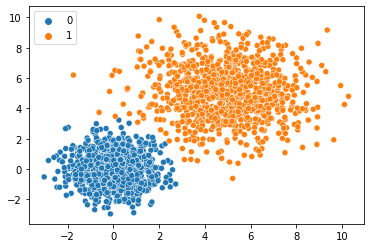

In [225]:
sns.scatterplot(x=df[:,0], y=df[:,1], hue=labels)

In [226]:
print('means\n',gm.means_)
print('weights\n',gm.weights_)
print('covariances\n',gm.covariances_)

means
 [[-0.00914715  0.00526497]
 [ 4.93607732  5.0436942 ]]
weights
 [0.50209027 0.49790973]
covariances
 [[0.92726837 1.0711295 ]
 [3.01222981 2.98268392]]


In [227]:
x1 = np.random.default_rng().multivariate_normal(gm.means_[0], np.diag(gm.covariances_[0]), 1000)
x2 = np.random.default_rng().multivariate_normal(gm.means_[1], np.diag(gm.covariances_[1]), 1000)
df = np.vstack([x1,x2])

<AxesSubplot:>

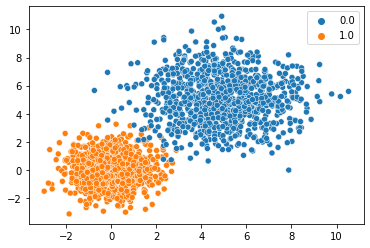

In [228]:
sns.scatterplot(x=df[:,0], y=df[:,1], hue=np.hstack([np.ones((1000)),np.zeros((1000))]))

# 3. Обработка текстовых данных

In [229]:
import string
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud

from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB

pd.set_option('max_colwidth', 400)


In [230]:
corpus = pd.read_csv('IMDB Dataset.csv')
corpus.columns

Index(['review', 'sentiment'], dtype='object')

In [231]:
corpus

,review,sentiment
0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regard...",positive
1,"A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire piece. <br /><br />The actors are extremely well chosen- Michael Sheen not only ""has got all the polari"" but he has all the voices down pat too! You can truly see the seamless editing guided by the ref...",positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. The plot is simplistic, but the dialogue is witty and the characters are likable (even the well bread suspected serial killer). While some may be disappointed when they realize this is not Match Point 2: Risk Addiction, I thought it was proof...",positive
3,"Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenly, Jake decides to become Rambo and kill the zombie.<br /><br />OK, first of all when you're going to make a film you must Decide if its a thriller or a drama! As a drama the movie is watchable. Paren...",negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei offers us a vivid portrait about human relations. This is a movie that seems to be telling us what money, power and success do to people in the different situations we encounter. <br /><br />This being a variation on the Arthur Schnitzler's play about the same theme, the director transfers the action t...",positive
...,...,...
49995,"I thought this movie did a down right good job. It wasn't as creative or original as the first, but who was expecting it to be. It was a whole lotta fun. the more i think about it the more i like it, and when it comes out on DVD I'm going to pay the money for it very proudly, every last cent. Sharon Stone is great, she always is, even if her movie is horrible(Catwoman), but this movie isn't, t...",positive
49996,"Bad plot, bad dialogue, bad acting, idiotic directing, the annoying porn groove soundtrack that ran continually over the overacted script, and a crappy copy of the VHS cannot be redeemed by consuming liquor. Trust me, because I stuck this turkey out to the end. It was so pathetically bad all over that I had to figure it was a fourth-rate spoof of Springtime for Hitler.<br /><br />The girl who ...",negative
49997,"I am a Catholic taught in parochial elementary schools by nuns, taught by Jesuit priests in high school & college. I am still a practicing Catholic but would not be considered a ""good Catholic"" in the church's eyes because I don't believe certain things or act certain ways just because the church tells me to.<br /><br />So back to the movie...its bad because two people are killed by this nun w...",negative
49998,"I'm going to have to disagree with the previous comment and side with Maltin on this one. This is a second rate, excessively vicious Western that creaks and groans trying to put across its central theme of the Wild West being tamed and kicked aside by the steady march of time. It would like to be in the tradition of ""Butch Cassidy and the Sundance Kid"", but lacks that film's poignancy and char...",negative


### 1) Предобработка данных

In [232]:
corpus['review'] = corpus['review'].str.lower()
corpus['review'] = corpus['review'].str.strip()
corpus['review'] = corpus['review'].str.replace('\d+','', regex=True)
corpus['review'] = corpus['review'].str.replace('br','', regex=True)
corpus['review'] = corpus['review'].str.replace('.','', regex=True)
nltk.download('stopwords')
stop_words = stopwords.words('english')
corpus['review'] = corpus['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
table = str.maketrans('', '', string.punctuation)
corpus['review'] = corpus['review'].str.translate(table)
nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()
corpus['review'] = corpus['review'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/linuxlite/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/linuxlite/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [233]:
corpus

,review,sentiment
0,one reviewer mentioned watching oz episode hooked right exactly happened me the first thing struck oz utality unflinching scene violence set right word go trust me show faint hearted timid show pull punch regard drug sex violence hardcore classic use word it called oz nickname given oswald maximum security state penitentary focus mainly emerald city experimental section prison cell glass front...,positive
1,wonderful little production the filming technique unassuming oldtimebbc fashion give comforting sometimes discomforting sense realism entire piece the actor extremely well chosen michael sheen ha got polari voice pat too truly see seamless editing guided reference williams diary entry well worth watching terrificly written performed piece masterful production one great master comedy life the r...,positive
2,thought wonderful way spend time hot summer weekend sitting air conditioned theater watching lighthearted comedy plot simplistic dialogue witty character likable even well ead suspected serial killer may disappointed realize match point risk addiction thought proof woody allen still fully control style many u grown love this id laughed one woodys comedy year dare say decade ive never impressed...,positive
3,basically there family little boy jake think there zombie closet parent fighting time this movie slower soap opera suddenly jake decides become rambo kill zombie ok first going make film must decide thriller drama drama movie watchable parent divorcing arguing like real life jake closet totally ruin film expected see boogeyman similar movie instead watched drama meaningless thriller spot well ...,negative
4,petter matteis love time money visually stunning film watch mr mattei offer u vivid portrait human relation movie seems telling u money power success people different situation encounter this variation arthur schnitzlers play theme director transfer action present time new york different character meet connect one connected one way another next person one seems know previous point contact styl...,positive
...,...,...
49995,thought movie right good job creative original first expecting whole lotta fun think like it come dvd im going pay money proudly every last cent sharon stone great always is even movie horriblecatwoman movie isnt one movie underrated lifetime probably become classic like yr wait classic watch enjoy expect masterpiece something thats gripping soul touching allow get life get involved theirs all...,positive
49996,bad plot bad dialogue bad acting idiotic directing annoying porn groove soundtrack ran continually overacted script crappy copy vhs cannot redeemed consuming liquor trust me stuck turkey end pathetically bad figure fourthrate spoof springtime hitler the girl played janis joplin faint spark interest could sing better original if want watch something similar thousand time better watch beyond val...,negative
49997,catholic taught parochial elementary school nun taught jesuit priest high school college still practicing catholic would considered good catholic church eye believe certain thing act certain way church tell to so back movieits bad two people killed nun supposed satire embodiment female religious figurehead comedy satire done well acting diane keaton never saw play different movie may good at f...,negative
49998,im going disagree previous comment side maltin one second rate excessively vicious western creak groan trying put across central theme wild west tamed kicked aside steady march time would like tradition butch cassidy sundance kid lack film poignancy charm andrew mclaglens direction limp final minute real botch incomprehensible strategy part hero charlton heston chris mitchum someone give holle...,negative


### 2) Визуализация

In [234]:
def generate_word_cloud(text):
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'white').generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

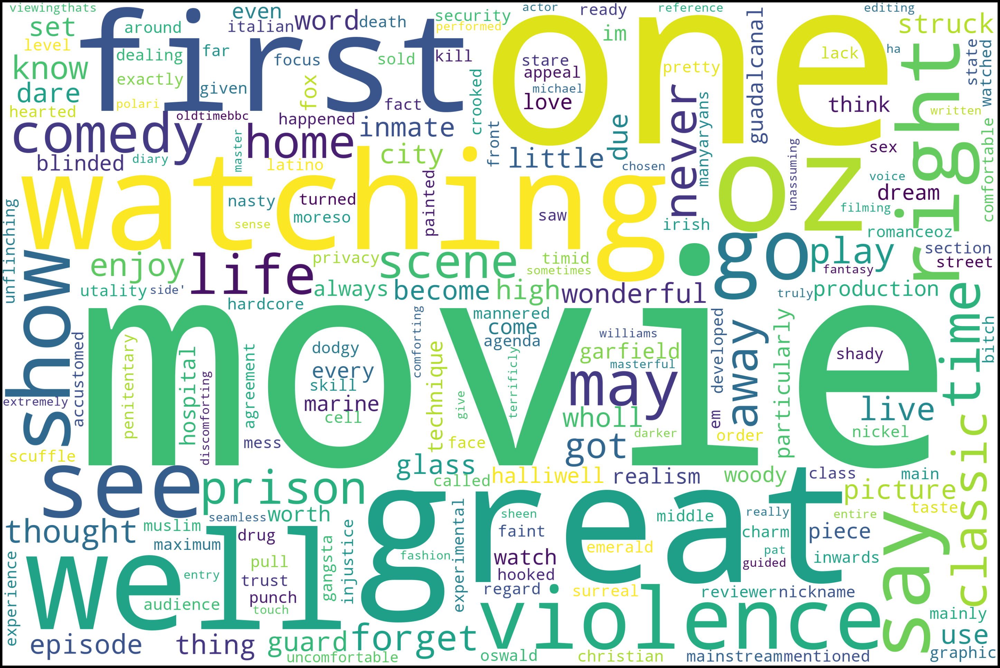

In [235]:
generate_word_cloud(corpus[corpus['sentiment']=='positive'].review.values)

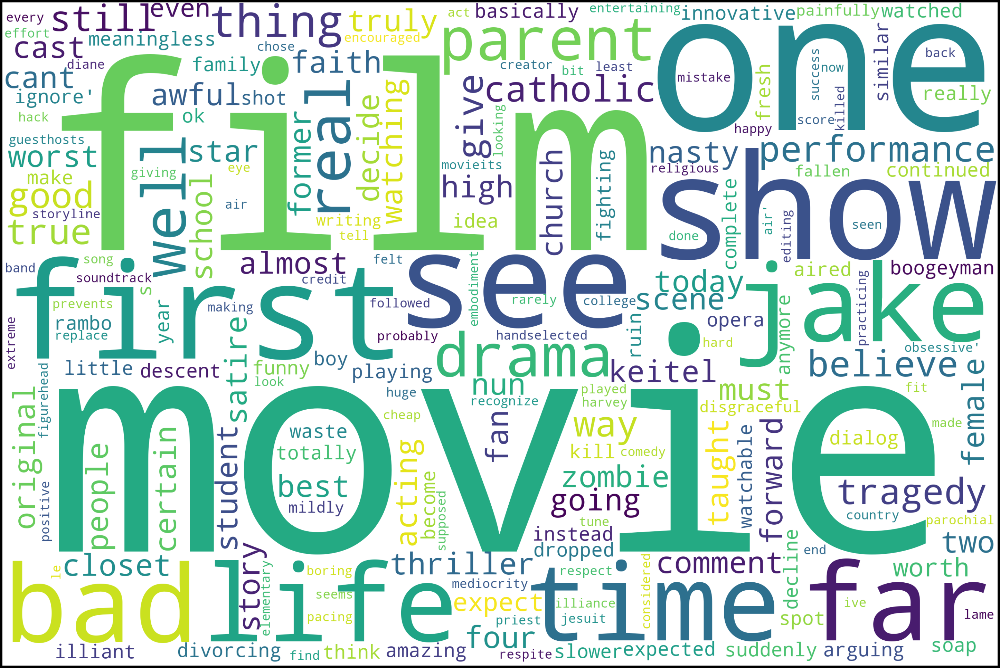

In [236]:
generate_word_cloud(corpus[corpus['sentiment']=='negative'].review.values)

### 3) Извлечение признаков и классификация

In [242]:
X = TfidfVectorizer(max_features=8000).fit_transform(corpus['review'])
y = corpus['sentiment']

In [243]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = MultinomialNB().fit(X_train, y_train)
prediction = model.predict(X_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 85.25%


In [244]:
from sklearn.metrics import silhouette_samples, silhouette_score, classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=1000, max_depth = 10, random_state=0)
classifier.fit(X_train, y_train) 

RandomForestClassifier(max_depth=10, n_estimators=1000, random_state=0)

In [245]:
y_pred = classifier.predict(X_test)

In [246]:
print('accuracy:',accuracy_score(y_test, y_pred))

accuracy: 0.8337
